In [1]:
%pylab nbagg
import mne
from noisy import NoisyChannels
from robust_reference import robust_reference
from utilities import union, set_diff, remove_reference

Populating the interactive namespace from numpy and matplotlib


Extracting EDF parameters from D:\JHU\NDD\Motor Imagery Data\S003R01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 9759  =      0.000 ...    60.994 secs...


<IPython.core.display.Javascript object>


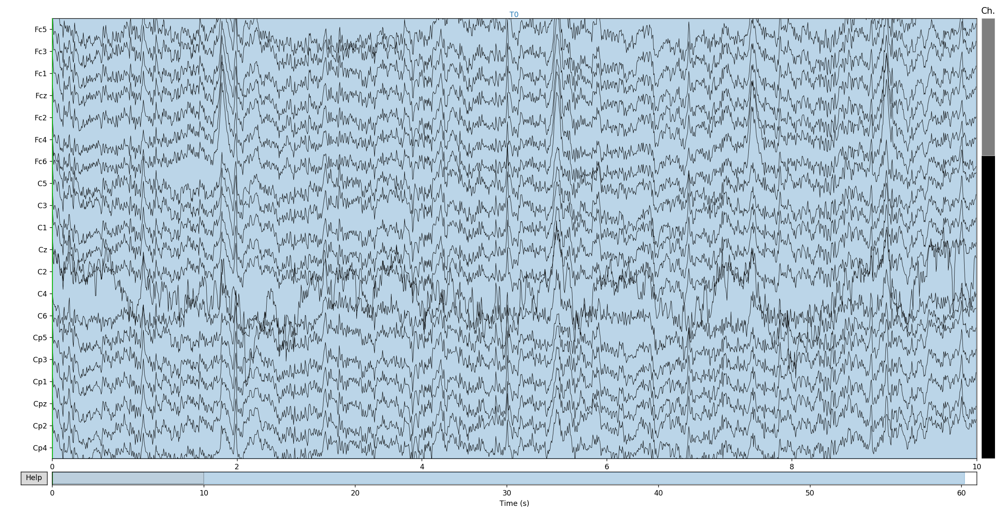

<IPython.core.display.Javascript object>


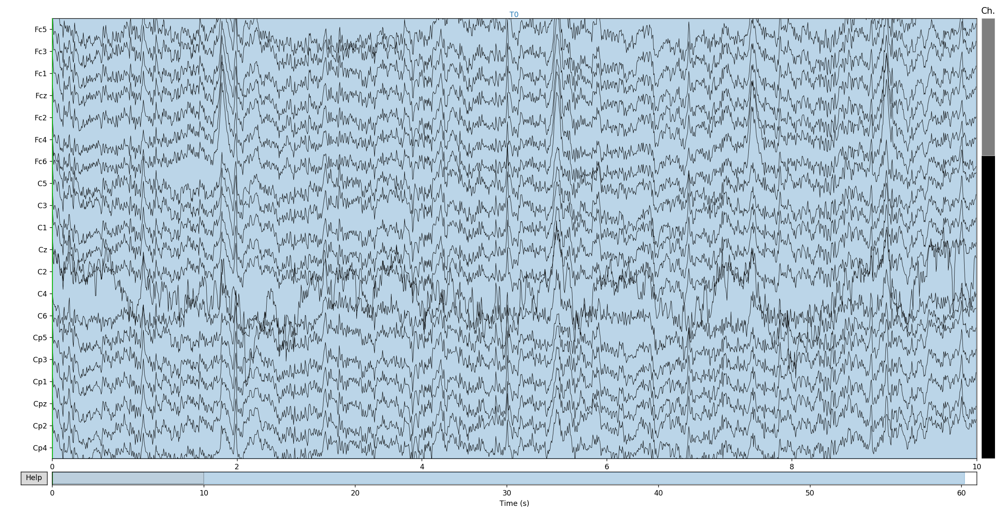

In [2]:
raw = mne.io.read_raw_edf("D:/JHU/NDD/Motor Imagery Data/S003R01.edf", preload=True)
raw.rename_channels(lambda s: s.strip("."))
ch_names = raw.info['ch_names']
raw.plot(bad_color='r', scalings=dict(eeg=5e-5))

raw data plot

In [3]:
raw_copy = raw.copy()
# Set PREP parameters
prep_params = {'ref_chs': ch_names, 'eval_chs': ch_names,
               'reref_chs': ch_names, 'line_freqs': 60}

# Set montage
montage_kind = "standard_1020"
montage = mne.channels.read_montage(
    kind=montage_kind, ch_names=raw_copy.info["ch_names"])
mne.set_log_level("WARNING")
raw_copy.set_montage(montage)

noisy_detector = NoisyChannels(raw_copy)
noisy_detector.find_bad_by_nan()
noisy_detector.find_bad_by_flat()
unusable_channels = union(noisy_detector.bad_by_nan, noisy_detector.bad_by_flat)
reference_channels = set_diff(prep_params['ref_chs'], unusable_channels)

EEG_data = raw_copy.get_data(picks='eeg')
# Change to uVolt
EEG_data = EEG_data*1e6
ch_names_original = raw_copy.info["ch_names"]
sample_rate = raw_copy.info["sfreq"]

<IPython.core.display.Javascript object>


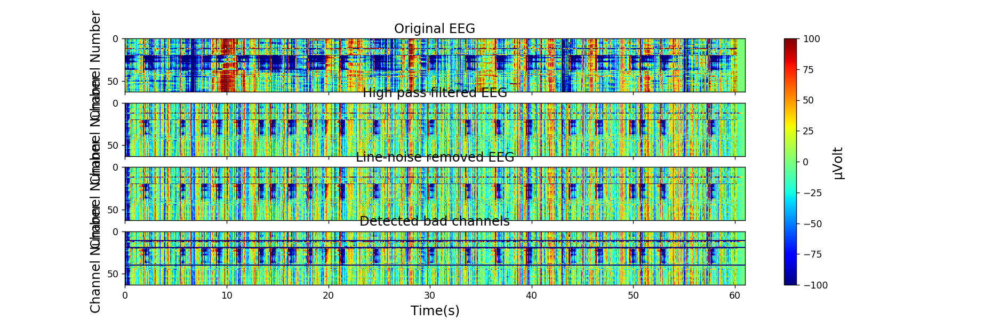

2019-11-21 21:58:22,914 - robust_reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': [], 'bad_by_deviation': ['Af7', 'C4', 'Cp6', 'Fp1', 'Fp2', 'Fpz'], 'bad_by_hf_noise': ['T8'], 'bad_by_correlation': ['C4', 'Cp6'], 'bad_by_ransac': ['C4', 'Cp6'], 'bad_all': ['Cp6', 'Fp1', 'Fpz', 'T8', 'C4', 'Af7', 'Fp2']}
2019-11-21 21:58:24,497 - robust_reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': [], 'bad_by_deviation': ['Cp6', 'Fp1', 'Fpz', 'Af8', 'Af4', 'C4', 'Af7', 'Fp2'], 'bad_by_hf_noise': ['T8'], 'bad_by_correlation': ['Cp6', 'C6', 'Fc3', 'Ft7', 'Fc5', 'C4'], 'bad_by_ransac': ['Cp6', 'C6', 'Fc3', 'Ft7', 'Fc5', 'C4'], 'bad_all': ['Cp6', 'Fp1', 'C6', 'Fpz', 'Fp2', 'Af8', 'Fc3', 'Af4', 'Ft7', 'Fc5', 'C4', 'Af7', 'T8']}
2019-11-21 21:58:24,523 - robust_reference - INFO - Iterations: 1
2019-11-21 21:58:26,020 - robust_reference - INFO - Bad channels: {'bad_by_nan': [], 'bad_by_flat': [], 'bad_by_deviation': ['Cp6', 'Fp1', 'Fpz', 'Af8', 'Af4', 'C4', 'Af7', 'Fp2']

Text(0.5, 0, 'Time(s)')

In [4]:
fig, axs = plt.subplots(4, sharex=True)
plt.setp(fig, facecolor=[1, 1, 1], figwidth=15)

im = axs[0].imshow(EEG_data, aspect='auto', extent=[0, (EEG_data.shape[1] / sample_rate), 63, 0],
              vmin=-100, vmax=100, cmap='jet')
axs[0].set_title('Original EEG', fontsize=14)
axs[0].set_ylabel('Channel Number', fontsize=14)
cb = fig.colorbar(im, ax=axs)
cb.set_label('\u03BCVolt', fontsize=14)

# Step 1: 1Hz high pass filtering
EEG_data = mne.filter.filter_data(EEG_data, sample_rate, 1, None, picks=None,
                       filter_length="auto", l_trans_bandwidth="auto",
                       h_trans_bandwidth="auto", n_jobs=1,
                       method="fir", iir_params=None,
                       copy=True, phase="zero", fir_window="hamming",
                       fir_design="firwin", pad="reflect_limited",
                       verbose=None)
axs[1].imshow(EEG_data, aspect='auto', extent=[0, (EEG_data.shape[1] / sample_rate), 63, 0],
              vmin=-100, vmax=100, cmap='jet')
axs[1].set_title('High pass filtered EEG', fontsize=14)
axs[1].set_ylabel('Channel Number', fontsize=14)

# Step 2: Removing line noise
linenoise = prep_params['line_freqs']
EEG_data = mne.filter.notch_filter(EEG_data, sample_rate, linenoise, filter_length="auto",
                        notch_widths=None, trans_bandwidth=1, method="fir",
                        iir_params=None, mt_bandwidth=None,
                        p_value=0.05, picks=None, n_jobs=1, copy=True, phase="zero",
                        fir_window="hamming", fir_design="firwin", pad="reflect_limited",
                        verbose=None)
axs[2].imshow(EEG_data, aspect='auto', extent=[0, (EEG_data.shape[1] / sample_rate), 63, 0],
              vmin=-100, vmax=100, cmap='jet')
axs[2].set_title('Line-noise removed EEG', fontsize=14)
axs[2].set_ylabel('Channel Number', fontsize=14)

# Step 3: Referencing
# Phase 1: Estimate the true signal mean with robust referencing
noisy_channels, reference_signal = robust_reference(raw_copy, prep_params)
unusable_index = [ch_names.index(ch) for ch in unusable_channels]
EEG_new = remove_reference(EEG_data, reference_signal, unusable_index)

# Phase 2: Find the bad channels and interpolate
raw_copy._data = EEG_new*1e-6
noisy_detector = NoisyChannels(raw_copy)
noisy_detector.find_all_bads()

# Noisy channels before interpolation
bad_before_interpolation = noisy_detector.get_bads()

bad_channels = union(bad_before_interpolation, unusable_channels)
raw_copy.info['bads'] = bad_channels
raw_copy.interpolate_bads()
reference_correct = np.nanmean(raw_copy.get_data(picks=reference_channels), axis=0)
EEG_new = remove_reference(EEG_new, reference_correct, unusable_index)
reference_signal = reference_signal + reference_correct
raw_copy._data = EEG_new*1e-6

EEG_tmp = EEG_new
bad_index = []
for i in range(len(bad_channels)):  # len(badChannels)
    bad_index.append(ch_names.index(bad_channels[i]))
    EEG_tmp[(bad_index[i] - 1), :] = np.ones((EEG_tmp.shape[1]))*-100
bad_index.sort()

axs[3].imshow(EEG_tmp, aspect='auto', extent=[0, (EEG_tmp.shape[1] / sample_rate), 63, 0],
              vmin=-100, vmax=100, cmap='jet')
axs[3].set_title('Detected bad channels', fontsize=14)
axs[3].set_ylabel('Channel Number', fontsize=14)
axs[3].set_xlabel('Time(s)', fontsize=14)

<IPython.core.display.Javascript object>


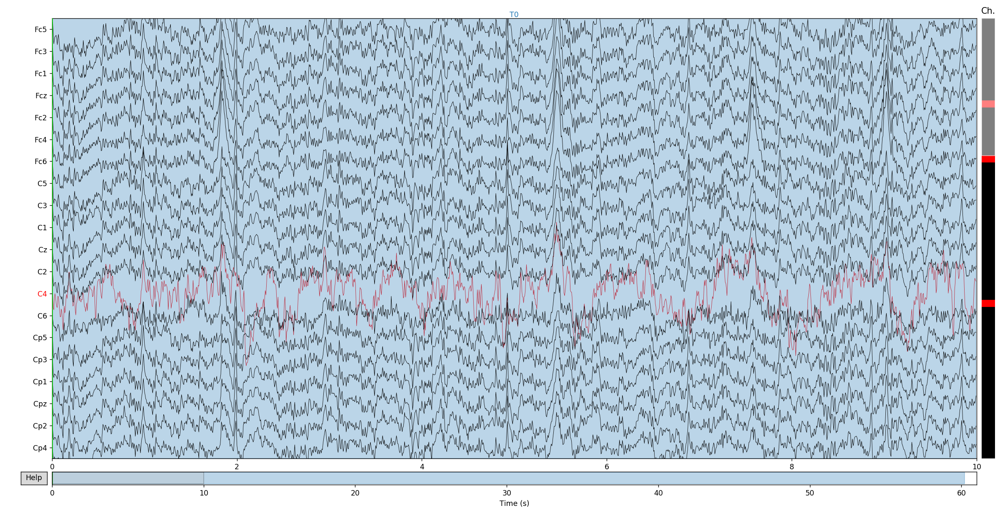

<IPython.core.display.Javascript object>


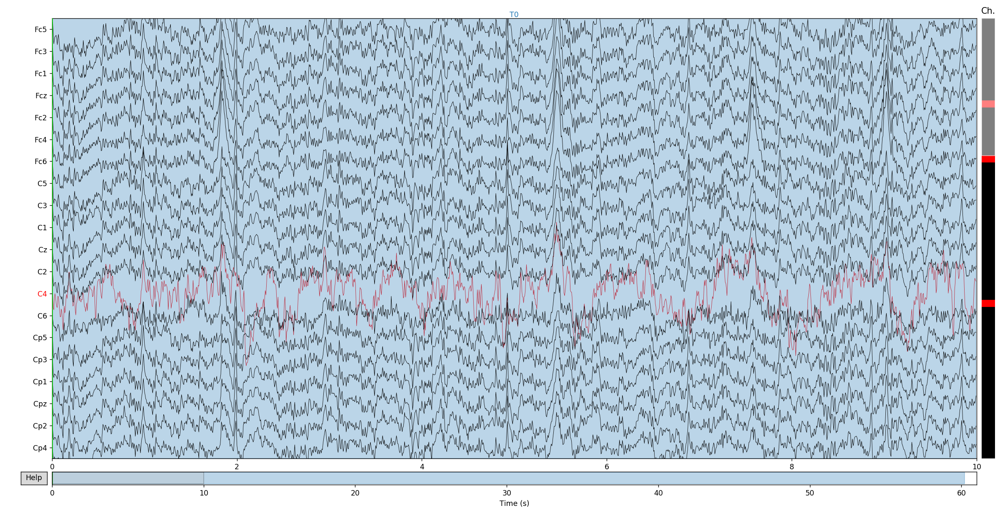

In [5]:
# Still noisy channels after interpolation
interpolated_channels = bad_channels
noisy_detector = NoisyChannels(raw_copy)
noisy_detector.find_all_bads()
still_noisy_channels = noisy_detector.get_bads()

raw_copy.info['bads'] = still_noisy_channels
raw_copy.plot(bad_color='r', scalings=dict(eeg=5e-5))